# Projection Black-Hole Diagnosis

Runs registration for frames 0–39 (warm start), then analyses **why**
projection holes (fill_value pixels) appear on the fixed target planes.

### Part 1 — Surface visualisation
- 1a: z-coordinate heatmaps per moving slice
- 1b: XY gradient magnitude (check smoothness)
- 1c: Gradient after 2× supersurface upsampling
- 1d: **3D surface rendering** — selected slices as spatial surfaces
- 1e: **Multi-slice 3D overlay** — all 20 slices on one axis
- 1f: **Wireframe close-up** — red edges = discontinuities

### Part 2 — Hole classification
- Per target plane, each hole pixel classified as:
  - **XY gap**: moving voxel nearby in XY, z within window, but pixel missed
  - **Z gap**: moving voxel nearby in XY, but z outside window
  - **No coverage**: no moving voxel within XY search radius

In [1]:
import os, sys, time
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
from pathlib import Path

import cupy as cp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import sobel, distance_transform_edt


# Paths — notebook runs from tests/ directory
HERE = Path.cwd()                        # .../tests/
PKG_DIR = HERE.parent                    # .../wholistic_registration/
SRC_DIR = PKG_DIR.parent                 # .../src/  ← needed for `from wholistic_registration.xxx`
sys.path.insert(0, str(SRC_DIR))
sys.path.insert(0, str(PKG_DIR))

from utils import IO, calFlowCrossResolution, mask, preprocess as prep
from utils.calFlowCrossResolution import project_coords_to_fixed_planes_gpu

sys.path.insert(0, str(HERE))  # tests/ dir for f260517_helpers
import f260517_helpers as fh

print("Imports OK.")

Imports OK.


In [2]:
# ================================================================
# Data loading
# ================================================================
F260517_mov_path = "/home/cyf/wbi/Virginia/raw_data/f260517/260517_exp_00001_TZCYX.ome.tiff"
F260517_ref_path = "/home/cyf/wbi/Virginia/raw_data/f260517/260517_anat_00003_TZCYX.ome.tiff"

F260517_mov, _ = IO.readTiff(F260517_mov_path)
F260517_ref, _ = IO.readTiff(F260517_ref_path)

F260517_ref_mem        = F260517_ref[90:310, 1, :, :].astype(np.float32)
F260517_ref_sparseCell = F260517_ref[90:310, 0, :, :].astype(np.float32)
F260517_mov_mem        = F260517_mov[:, :, 1, :, :].astype(np.float32)
F260517_mov_sparseCell = F260517_mov[:, :, 0, :, :].astype(np.float32)

print(f"ref_mem:  {F260517_ref_mem.shape}")
print(f"mov_mem:  {F260517_mov_mem.shape}")
print("Data loaded.")

ref_mem:  (220, 1500, 630)
mov_mem:  (200, 20, 1500, 630)
Data loaded.


In [3]:
# ================================================================
# Setup
# ================================================================
option = {}
option["r"] = 5
option["layer"] = 3
option["iter"] = 10
option["movRange"] = 5.0
option["tol"] = 1e-6
option["zRatio_HR"] = 1
option["wrong_region_enable"] = False

thresFactor = 5.0
maskRange = [5.0, 4000.0]
smoothPenalty_raw = 0.03
percentiles = [0.1, 0.5, 1, 2, 5, 10, 25, 50, 75, 90, 95, 99, 99.5, 99.8]

Z_WINDOW = 3.0
SURFACE_UPSAMPLE = 2

# ---- z_init ----
z_init = calFlowCrossResolution.FindInitZ_stack_global_fixed_spacing(
    F260517_mov_mem[0].transpose(2, 1, 0),
    F260517_ref_mem.transpose(2, 1, 0),
    delta_ref_idx=10, use_gradient=False,
)
z_init = np.asarray(z_init, dtype=np.float32)
z_idx = np.rint(z_init).astype(np.int32)
z_idx = np.clip(z_idx, 0, F260517_ref_mem.shape[0] - 1)

K = int(z_init.shape[0])
T = int(F260517_mov_mem.shape[0])

x_coord = np.arange(F260517_mov_mem[0].shape[2], dtype=np.float32)
y_coord = np.arange(F260517_mov_mem[0].shape[1], dtype=np.float32)
k_coord = np.arange(K, dtype=np.int32)
X_grid, Y_grid, K_grid = np.meshgrid(x_coord, y_coord, k_coord, indexing="ij")
coords_xyz = np.empty((len(x_coord), len(y_coord), K, 3), dtype=np.float32)
coords_xyz[..., 0] = X_grid
coords_xyz[..., 1] = Y_grid
coords_xyz[..., 2] = z_init[K_grid]
option["phase"] = coords_xyz.copy()

print(f"K={K}, T={T}")

K=20, T=200


In [4]:
# ================================================================
# Initial reference calibration
# ================================================================
init_target = np.mean(F260517_mov_mem[[0, 1, 2, 3, 4]].astype(np.float32), axis=0)
ref_mem_adj, _, _, _ = fh.update_reference_intensity_mapping_from_target_stack(
    F260517_ref_mem=F260517_ref_mem,
    target_stack_zyx=init_target, z_idx=z_idx, option=option,
    thresFactor=thresFactor, maskRange=maskRange,
    smoothPenalty_raw=smoothPenalty_raw, percentiles=percentiles,
)
print("Initial ref calibration done.")

Initial ref calibration done.


In [5]:
# ================================================================
# Register frames 0–39 for warm start  (+ store per-frame errors)
# ================================================================
print("Registering frames 0–39 ...")
registered = {}
error_records = []

for i in range(0, 40):
    if i == 0:
        option["phase"] = coords_xyz.copy()
        option.pop("motion", None)

    raw_mem_zyx = F260517_mov_mem[i]
    mov_mem_i = raw_mem_zyx.transpose(2, 1, 0).astype(np.float32, copy=False)

    option["mask_mov"] = mask.getMask(mov_mem_i, thresFactor)
    option["mask_mov"] = mask.bwareafilt3_wei(option["mask_mov"], maskRange)

    phase_new, motion_current, mem_mapped = calFlowCrossResolution.getMotion_v2(
        mov_mem_i, ref_mem_adj, option, verbose=False)

    if hasattr(phase_new, "get"):      phase_new = phase_new.get()
    if hasattr(motion_current, "get"): motion_current = motion_current.get()
    if hasattr(mem_mapped, "get"):     mem_mapped = mem_mapped.get()

    phase_new      = np.asarray(phase_new, dtype=np.float32)
    motion_current = np.asarray(motion_current, dtype=np.float32)
    mem_mapped     = np.asarray(mem_mapped, dtype=np.float32)

    # ---- Per-frame errors ----
    mem_err  = float(np.mean(np.abs(mov_mem_i - mem_mapped)))
    z_surf   = phase_new[..., 2]  # (X, Y, K)
    z_dev_k  = [float(np.std(z_surf[:,:,kk][np.isfinite(z_surf[:,:,kk])]))
                for kk in range(K) if np.isfinite(z_surf[:,:,kk]).sum() > 100]
    z_range_k = [float(np.percentile(z_surf[:,:,kk][np.isfinite(z_surf[:,:,kk])], 99) -
                       np.percentile(z_surf[:,:,kk][np.isfinite(z_surf[:,:,kk])], 1))
                 for kk in range(K) if np.isfinite(z_surf[:,:,kk]).sum() > 100]
    motion_mag = float(np.mean(np.sqrt(np.sum(motion_current**2, axis=-1))))

    error_records.append({
        "frame": i,
        "mem_err": mem_err,
        "mean_z_dev": np.mean(z_dev_k),        # within-slice z std — surface wiggliness
        "mean_z_range": np.mean(z_range_k),     # within-slice z spread — total z warp
        "motion_mag": motion_mag,               # mean L2 norm of motion field
    })

    registered[i] = {
        "phase_new": phase_new,
        "motion":    motion_current,
    }

    option["motion"] = (0.7 * motion_current).astype(np.float32, copy=False)

    if i % 5 == 0:
        print(f"  frame {i:2d}: mem_err={mem_err:.1f}  z_dev={np.mean(z_dev_k):.2f}  "
              f"z_range={np.mean(z_range_k):.2f}  motion_mag={motion_mag:.3f}")

print("Warmup registration complete.")

df_errors = pd.DataFrame(error_records)
print(f"\nError summary over {len(df_errors)} frames:")
print(df_errors.describe().to_string())

Registering frames 0–39 ...
  frame  0: mem_err=171.1  z_dev=1.37  z_range=6.93  motion_mag=5.544
  frame  5: mem_err=174.5  z_dev=1.64  z_range=8.11  motion_mag=7.573
  frame 10: mem_err=171.3  z_dev=1.51  z_range=7.27  motion_mag=6.938
  frame 15: mem_err=170.6  z_dev=1.67  z_range=7.94  motion_mag=7.134
  frame 20: mem_err=170.9  z_dev=1.81  z_range=8.36  motion_mag=7.010
  frame 25: mem_err=170.6  z_dev=1.74  z_range=8.32  motion_mag=7.933
  frame 30: mem_err=170.3  z_dev=1.76  z_range=8.40  motion_mag=7.316
  frame 35: mem_err=170.1  z_dev=1.80  z_range=8.67  motion_mag=6.745
Warmup registration complete.

Error summary over 40 frames:
           frame     mem_err  mean_z_dev  mean_z_range  motion_mag
count  40.000000   40.000000   40.000000     40.000000   40.000000
mean   19.500000  170.858140    1.690952      8.088841    7.101128
std    11.690452    0.798157    0.144651      0.600871    0.629658
min     0.000000  169.795044    1.295279      6.367796    5.543649
25%     9.750000

In [6]:
# ================================================================
# Determine fixed_target_z
# ================================================================
target_z_list = []
for i in [0, 1, 2, 3, 4]:
    tz, _ = fh.estimate_projection_z_from_phase_simple(
        phase_new=registered[i]["phase_new"],
        z_init=z_init, ref_shape=F260517_ref_mem.shape,
        ref_volume_order="zyx", method="trimmed_mean",
        trim_percentiles=(5, 95), frame_idx=i,
    )
    target_z_list.append(tz)

fixed_target_z = fh.robust_average_target_z(target_z_list, method="median")
bad = ~np.isfinite(fixed_target_z)
fixed_target_z[bad] = z_init[bad]

print(f"fixed_target_z: {fixed_target_z}")
print(f"N planes: {len(fixed_target_z)}")

fixed_target_z: [ 20.452873  30.243082  40.325706  50.61463   60.357082  70.58426
  80.78758   90.52251  100.4492   110.8054   121.00049  130.7578
 140.4652   150.20271  160.85056  170.8468   180.82951  190.61911
 200.63802  210.44785 ]
N planes: 20


In [16]:
# ================================================================
# Pick analysis frame
# ================================================================
ANALYSIS_FRAME =20

phase_new = registered[ANALYSIS_FRAME]["phase_new"]  # (X, Y, K, 3)
X, Y_mov, K_local = phase_new.shape[0], phase_new.shape[1], phase_new.shape[2]
z_ref_all = phase_new[..., 2]  # (X, Y_mov, K) — z coordinate in reference space

print(f"phase_new shape: {phase_new.shape}")
print(f"Moving dims: X={X}, Y={Y_mov}, K={K_local}")

phase_new shape: (630, 1500, 20, 3)
Moving dims: X=630, Y=1500, K=20


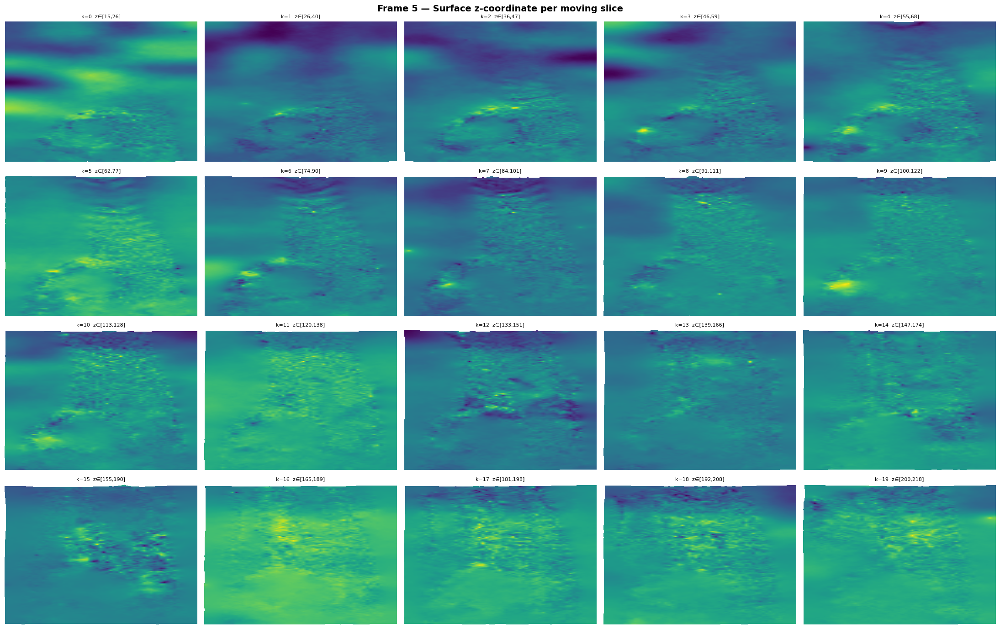

In [8]:
# #################################################################
# Part 1a — Z-coordinate heatmaps per moving slice
# #################################################################
fig, axes = plt.subplots(4, 5, figsize=(22, 14))
axes = axes.ravel()

for k_idx in range(K_local):
    ax = axes[k_idx]
    z_plane = z_ref_all[:, :, k_idx]
    xref = phase_new[..., 0][:, :, k_idx]
    yref = phase_new[..., 1][:, :, k_idx]
    valid_xy = (
        (xref >= 0) & (xref < F260517_ref_mem.shape[2]) &
        (yref >= 0) & (yref < F260517_ref_mem.shape[1])
    )
    z_display = z_plane.copy()
    z_display[~valid_xy] = np.nan

    ax.imshow(z_display.T, origin='lower', aspect='auto',
              cmap='viridis', interpolation='nearest')
    ax.set_title(f"k={k_idx}  z∈[{np.nanmin(z_display):.0f},{np.nanmax(z_display):.0f}]",
                 fontsize=8)
    ax.axis('off')

fig.suptitle(f"Frame {ANALYSIS_FRAME} — Surface z-coordinate per moving slice",
             fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

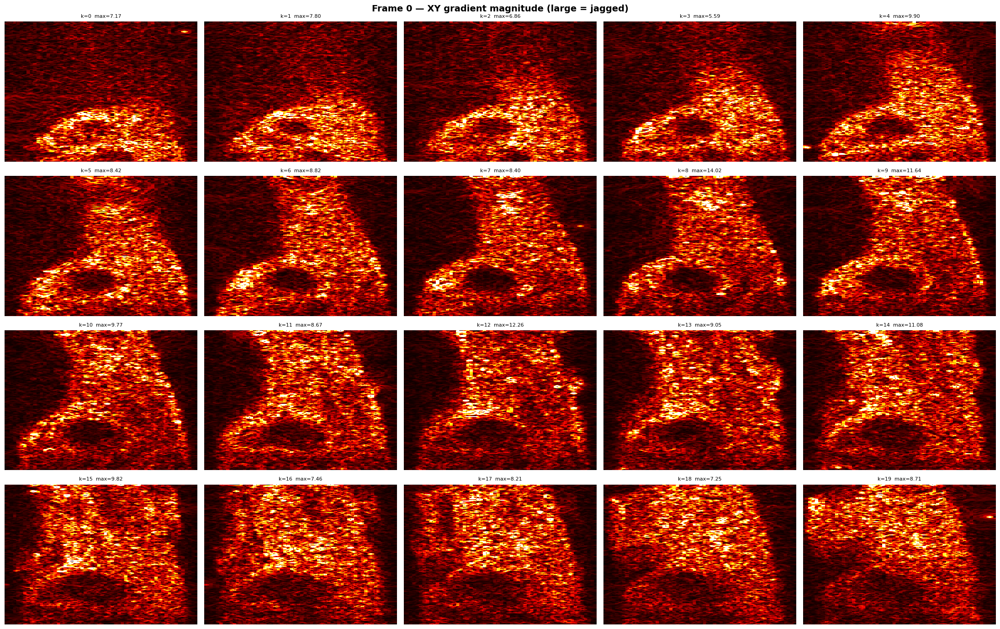

Per-slice gradient summary:
  k= 0: z_range=[15.1,27.3]  grad_median=0.253  grad_p99=2.161
  k= 1: z_range=[23.4,40.7]  grad_median=0.254  grad_p99=2.080
  k= 2: z_range=[33.5,46.6]  grad_median=0.264  grad_p99=2.167
  k= 3: z_range=[43.6,60.3]  grad_median=0.277  grad_p99=2.296
  k= 4: z_range=[52.2,66.9]  grad_median=0.315  grad_p99=2.235
  k= 5: z_range=[59.7,77.8]  grad_median=0.343  grad_p99=2.551
  k= 6: z_range=[72.0,91.2]  grad_median=0.375  grad_p99=2.877
  k= 7: z_range=[82.1,102.0]  grad_median=0.394  grad_p99=3.256
  k= 8: z_range=[81.5,113.6]  grad_median=0.434  grad_p99=3.611
  k= 9: z_range=[97.7,124.4]  grad_median=0.456  grad_p99=3.602
  k=10: z_range=[107.9,127.8]  grad_median=0.464  grad_p99=3.619
  k=11: z_range=[119.8,137.1]  grad_median=0.484  grad_p99=3.172
  k=12: z_range=[129.7,150.6]  grad_median=0.505  grad_p99=3.932
  k=13: z_range=[137.4,165.5]  grad_median=0.539  grad_p99=3.528
  k=14: z_range=[148.8,170.8]  grad_median=0.562  grad_p99=3.341
  k=15: z_rang

In [15]:
# #################################################################
# Part 1b — XY gradient magnitude (smoothness check)
# #################################################################
fig, axes = plt.subplots(4, 5, figsize=(22, 14))
axes = axes.ravel()

for k_idx in range(K_local):
    ax = axes[k_idx]
    z_plane = z_ref_all[:, :, k_idx].copy()
    nan_mask = ~np.isfinite(z_plane)
    if nan_mask.any():
        z_plane[nan_mask] = np.nanmedian(z_plane[~nan_mask])

    gx = sobel(z_plane, axis=0, mode='nearest')
    gy = sobel(z_plane, axis=1, mode='nearest')
    grad_mag = np.sqrt(gx**2 + gy**2)

    ax.imshow(grad_mag.T, origin='lower', aspect='auto', cmap='hot',
              interpolation='nearest', vmin=0, vmax=np.percentile(grad_mag, 99))
    ax.set_title(f"k={k_idx}  max={grad_mag.max():.2f}", fontsize=8)
    ax.axis('off')

fig.suptitle(f"Frame {ANALYSIS_FRAME} — XY gradient magnitude (large = jagged)",
             fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

print("Per-slice gradient summary:")
for k_idx in range(K_local):
    z_plane = z_ref_all[:, :, k_idx]
    valid = np.isfinite(z_plane)
    if valid.any():
        gx = sobel(z_plane.copy(), axis=0, mode='nearest')
        gy = sobel(z_plane.copy(), axis=1, mode='nearest')
        g = np.sqrt(gx**2 + gy**2)
        print(f"  k={k_idx:2d}: z_range=[{np.nanmin(z_plane):.1f},{np.nanmax(z_plane):.1f}]  "
              f"grad_median={np.median(g[valid]):.3f}  grad_p99={np.percentile(g[valid], 99):.3f}")

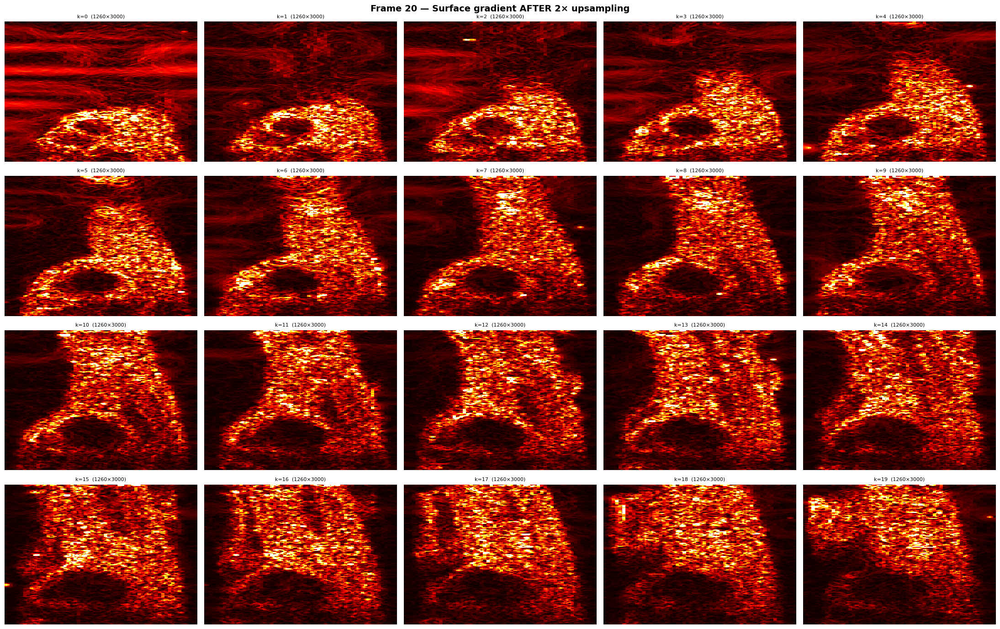

In [19]:
# #################################################################
# Part 1c — Gradient after 2× supersurface upsampling
# #################################################################
phase_up = fh.upsample_phase_xy_for_supersurface(phase_new, upsample_factor=SURFACE_UPSAMPLE)
Xup, Yup = phase_up.shape[0], phase_up.shape[1]
z_up = phase_up[..., 2]

fig, axes = plt.subplots(4, 5, figsize=(22, 14))
axes = axes.ravel()

for k_idx in range(K_local):
    ax = axes[k_idx]
    z_plane = z_up[:, :, k_idx]
    gx = sobel(z_plane, axis=0, mode='nearest')
    gy = sobel(z_plane, axis=1, mode='nearest')
    grad_mag = np.sqrt(gx**2 + gy**2)

    ax.imshow(grad_mag.T, origin='lower', aspect='auto', cmap='hot',
              interpolation='nearest', vmin=0, vmax=np.percentile(grad_mag, 99))
    ax.set_title(f"k={k_idx}  ({Xup}×{Yup})", fontsize=8)
    ax.axis('off')

fig.suptitle(f"Frame {ANALYSIS_FRAME} — Surface gradient AFTER {SURFACE_UPSAMPLE}× upsampling",
             fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

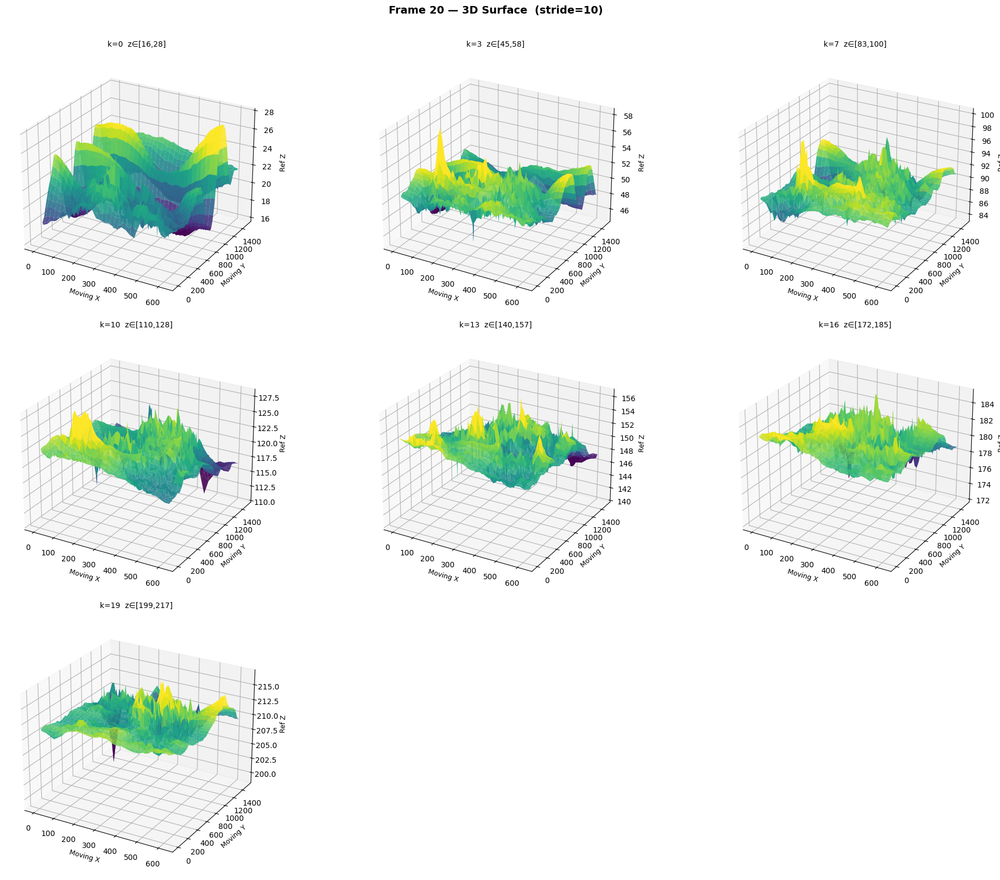

Smooth surface = gentle slopes. Jagged = sharp spikes.
Downsampled 10× for rendering; full 630×1500 per slice.


In [17]:
# #################################################################
# Part 1d — 3D surface rendering of selected slices
# #################################################################
STRIDE = 10
SLICES_TO_PLOT = [0, 3, 7, 10, 13, 16, 19]

fig = plt.figure(figsize=(20, 16))

for sub_idx, k_idx in enumerate(SLICES_TO_PLOT):
    ax = fig.add_subplot(3, 3, sub_idx + 1, projection='3d')

    x_mov = np.arange(0, X, STRIDE, dtype=np.float32)
    y_mov = np.arange(0, Y_mov, STRIDE, dtype=np.float32)
    Xm, Ym = np.meshgrid(x_mov, y_mov, indexing='ij')

    z_surf = z_ref_all[::STRIDE, ::STRIDE, k_idx]
    xref_ds = phase_new[::STRIDE, ::STRIDE, k_idx, 0]
    yref_ds = phase_new[::STRIDE, ::STRIDE, k_idx, 1]
    valid_ds = (
        (xref_ds >= 0) & (xref_ds < F260517_ref_mem.shape[2]) &
        (yref_ds >= 0) & (yref_ds < F260517_ref_mem.shape[1]) &
        np.isfinite(z_surf)
    )
    z_display = z_surf.copy()
    z_display[~valid_ds] = np.nan

    ax.plot_surface(Xm, Ym, z_display, cmap='viridis', edgecolor='none',
                    alpha=0.9, antialiased=True,
                    vmin=np.nanpercentile(z_display, 2),
                    vmax=np.nanpercentile(z_display, 98))

    ax.set_xlabel('Moving X', fontsize=9)
    ax.set_ylabel('Moving Y', fontsize=9)
    ax.set_zlabel('Ref Z', fontsize=9)
    ax.set_title(f'k={k_idx}  z∈[{np.nanmin(z_display):.0f},{np.nanmax(z_display):.0f}]',
                 fontsize=10)
    ax.view_init(elev=25, azim=-60)

fig.suptitle(f'Frame {ANALYSIS_FRAME} — 3D Surface  (stride={STRIDE})',
             fontsize=14, fontweight='bold', y=1.01)
fig.tight_layout()
plt.show()

print(f"Smooth surface = gentle slopes. Jagged = sharp spikes.")
print(f"Downsampled {STRIDE}× for rendering; full {X}×{Y_mov} per slice.")

In [ ]:
# #################################################################
# Part 1e — Multi-slice 3D overlay (all K slices on one axis)
# #################################################################
STRIDE_OVERLAY = 30

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

x_mov = np.arange(0, X, STRIDE_OVERLAY, dtype=np.float32)
y_mov = np.arange(0, Y_mov, STRIDE_OVERLAY, dtype=np.float32)
Xm, Ym = np.meshgrid(x_mov, y_mov, indexing='ij')

colors = cm.tab20(np.linspace(0, 1, K_local))

for k_idx in range(K_local):
    z_surf = z_ref_all[::STRIDE_OVERLAY, ::STRIDE_OVERLAY, k_idx]
    xref_ds = phase_new[::STRIDE_OVERLAY, ::STRIDE_OVERLAY, k_idx, 0]
    yref_ds = phase_new[::STRIDE_OVERLAY, ::STRIDE_OVERLAY, k_idx, 1]
    valid_ds = (
        (xref_ds >= 0) & (xref_ds < F260517_ref_mem.shape[2]) &
        (yref_ds >= 0) & (yref_ds < F260517_ref_mem.shape[1]) &
        np.isfinite(z_surf)
    )
    z_display = z_surf.copy()
    z_display[~valid_ds] = np.nan

    ax.plot_surface(Xm, Ym, z_display, color=colors[k_idx],
                    edgecolor='none', alpha=0.35, antialiased=True)

ax.set_xlabel('Moving X', fontsize=11)
ax.set_ylabel('Moving Y', fontsize=11)
ax.set_zlabel('Ref Z', fontsize=11)
ax.set_title(f'Frame {ANALYSIS_FRAME} — All {K_local} slices overlaid  (stride={STRIDE_OVERLAY})',
             fontsize=14, fontweight='bold')
ax.view_init(elev=20, azim=-50)
fig.tight_layout()
plt.show()

print("Each colour = one moving slice. Should be roughly parallel sheets.")
print("Crossing or sharp local deviations → surface not smooth locally.")

In [ ]:
# #################################################################
# Part 1f — Wireframe close-up with discontinuity highlighting
# #################################################################
CLOSEUP_K = 10
CLOSEUP_STRIDE = 8
GRAD_THRESH = 0.15

z_close = z_ref_all[::CLOSEUP_STRIDE, ::CLOSEUP_STRIDE, CLOSEUP_K]
Xc, Yc = z_close.shape

gx_close = sobel(z_close, axis=0, mode='nearest')
gy_close = sobel(z_close, axis=1, mode='nearest')
grad_close = np.sqrt(gx_close**2 + gy_close**2)

jagged_edges = grad_close > GRAD_THRESH
print(f"Slice k={CLOSEUP_K}: {jagged_edges.sum()} / {Xc*Yc} grid cells "
      f"exceed gradient threshold {GRAD_THRESH} "
      f"({100*jagged_edges.sum()/(Xc*Yc):.1f}%)")

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

x_c = np.arange(0, X, CLOSEUP_STRIDE, dtype=np.float32)
y_c = np.arange(0, Y_mov, CLOSEUP_STRIDE, dtype=np.float32)
Xcm, Ycm = np.meshgrid(x_c, y_c, indexing='ij')

# Smooth regions — grey
z_smooth = z_close.copy()
z_smooth[jagged_edges] = np.nan
ax.plot_wireframe(Xcm, Ycm, z_smooth, color='#888888', linewidth=0.3, alpha=0.5)

# Jagged regions — red
z_jagged = z_close.copy()
z_jagged[~jagged_edges] = np.nan
ax.plot_wireframe(Xcm, Ycm, z_jagged, color='#FF3333', linewidth=0.8, alpha=0.9)

ax.set_xlabel('Moving X', fontsize=11)
ax.set_ylabel('Moving Y', fontsize=11)
ax.set_zlabel('Ref Z', fontsize=11)
ax.set_title(f'Frame {ANALYSIS_FRAME}  k={CLOSEUP_K}  Wireframe  '
             f'(red = grad > {GRAD_THRESH})  stride={CLOSEUP_STRIDE}',
             fontsize=13, fontweight='bold')
ax.view_init(elev=30, azim=-45)
fig.tight_layout()
plt.show()

print("Red isolated spikes → local discontinuities → likely cause XY gaps.")
print("Red coherent patches → genuinely steep region (normal).")

In [20]:
# #################################################################
# Part 2a — Build projection coverage map
# #################################################################
print("Building coverage map ...")
t0 = time.time()

ref_for_proj = ref_mem_adj

coverage = project_coords_to_fixed_planes_gpu(
    coords_ref_xyk_xyz=phase_up,
    ref_volume=ref_for_proj,
    target_z_planes=fixed_target_z,
    values_xyk=np.ones(phase_up.shape[:-1], dtype=np.float32),
    ref_volume_order="xyz",
    z_window=Z_WINDOW,
    downsample_xy=1,
    fill_value=0.0,
    return_numpy=True,
    output_order="zyx",
    xy_splat_mode="subpixel_footprint",
    xy_extra_radius=0,
)

if hasattr(coverage, "get"):
    coverage = coverage.get()
coverage = np.asarray(coverage, dtype=np.float32)

Nplanes, Hy, Hx = coverage.shape
print(f"Coverage: {coverage.shape}  uncovered={float(np.mean(coverage==0)):.4f}")
print(f"Done in {time.time()-t0:.1f}s")

Building coverage map ...
Coverage: (20, 1500, 630)  uncovered=0.1035
Done in 1.6s


In [21]:
# #################################################################
# Part 2b — Classify each hole
# #################################################################
from scipy.spatial import cKDTree

XY_SEARCH_RADIUS = 2.0

coords_flat = phase_up.reshape(-1, 3).astype(np.float32)
xref_flat = coords_flat[:, 0]
yref_flat = coords_flat[:, 1]
zref_flat = coords_flat[:, 2]

Xref, Yref, Zref = ref_for_proj.shape
in_bounds = (
    (xref_flat >= 0) & (xref_flat <= Xref - 1) &
    (yref_flat >= 0) & (yref_flat <= Yref - 1) &
    (zref_flat >= 0) & (zref_flat <= Zref - 1) &
    np.isfinite(xref_flat) & np.isfinite(yref_flat) & np.isfinite(zref_flat)
)
xo_valid = xref_flat[in_bounds]
yo_valid = yref_flat[in_bounds]
zref_valid = zref_flat[in_bounds]
print(f"Moving voxels: {len(xref_flat):,} total, {in_bounds.sum():,} in-bounds")

hole_stats = []
hole_detail = []

print("Classifying holes ...")
t0 = time.time()

tree = cKDTree(np.column_stack([xo_valid, yo_valid]))

for m in range(Nplanes):
    tz = fixed_target_z[m]
    hole_mask = coverage[m] == 0
    n_holes = int(hole_mask.sum())

    if n_holes == 0:
        hole_stats.append({"plane": m, "target_z": tz, "n_holes": 0,
                           "xy_gap": 0, "z_gap": 0, "no_coverage": 0})
        continue

    hy, hx = np.where(hole_mask)
    hole_coords = np.column_stack([hx, hy]).astype(np.float32)

    dists, idxs = tree.query(hole_coords, k=1, distance_upper_bound=XY_SEARCH_RADIUS)

    n_xy_gap = 0
    n_z_gap = 0
    n_no_cov = 0

    for j in range(n_holes):
        if np.isinf(dists[j]):
            n_no_cov += 1
        else:
            if abs(zref_valid[idxs[j]] - tz) <= Z_WINDOW:
                n_xy_gap += 1
            else:
                n_z_gap += 1

    hole_stats.append({
        "plane": m, "target_z": tz, "n_holes": n_holes,
        "xy_gap": n_xy_gap, "z_gap": n_z_gap, "no_coverage": n_no_cov,
    })

    if m in [0, 5, 10, 15, 19]:
        for j in range(n_holes):
            cat = ("xy_gap" if (not np.isinf(dists[j]) and abs(zref_valid[idxs[j]]-tz) <= Z_WINDOW)
                   else "z_gap" if not np.isinf(dists[j])
                   else "no_coverage")
            hole_detail.append({
                "plane": m, "target_z": tz,
                "hole_x": hx[j], "hole_y": hy[j],
                "nearest_dist": float(dists[j]) if not np.isinf(dists[j]) else np.nan,
                "nearest_z": float(zref_valid[idxs[j]]) if not np.isinf(dists[j]) else np.nan,
                "category": cat,
            })

df_stats = pd.DataFrame(hole_stats)
df_detail = pd.DataFrame(hole_detail)
print(f"Done in {time.time()-t0:.1f}s")

Moving voxels: 75,600,000 total, 74,664,589 in-bounds
Classifying holes ...
Done in 43.4s


In [23]:
# #################################################################
# Part 2c — Summary
# #################################################################
total_holes = df_stats["n_holes"].sum()
total_xy    = df_stats["xy_gap"].sum()
total_z     = df_stats["z_gap"].sum()
total_nocov = df_stats["no_coverage"].sum()

print("=" * 70)
print(f"Frame {ANALYSIS_FRAME} — Hole Classification Summary")
print("=" * 70)
print(f"Total output pixels:   {Nplanes * Hy * Hx:>12,}")
print(f"Total holes:           {total_holes:>12,}  "
      f"({100*total_holes/(Nplanes*Hy*Hx):.2f}%)")
print(f"  - XY gap:            {total_xy:>12,}  "
      f"({100*total_xy/max(total_holes,1):.1f}% of holes)")
print(f"  - Z out-of-window:   {total_z:>12,}  "
      f"({100*total_z/max(total_holes,1):.1f}% of holes)")
print(f"  - No coverage:       {total_nocov:>12,}  "
      f"({100*total_nocov/max(total_holes,1):.1f}% of holes)")
print("=" * 70)

if total_z > total_xy:
    print("→ VERDICT: Z gaps dominate → widen z_window or add more target planes")
elif total_xy > total_z:
    print("→ VERDICT: XY gaps dominate → increase supersurface upsampling")
else:
    print("→ VERDICT: Mixed — both XY and Z contribute similarly")

print("\n--- Per-plane breakdown ---")

for _, row in df_stats.iterrows():
    n = row["n_holes"]
    if n == 0:
        print(f"  plane {row['plane']:2d}  z={row['target_z']:.0f}:  NO HOLES")
    else:
        n = int(row["n_holes"])          # ← 加 int()
        p = int(row["plane"])            # ← 加 int()
        print(f"  plane {p:2d}  z={row['target_z']:.0f}:  "
              f"holes={n:6d}  xy={row['xy_gap']/n*100:.0f}%  "
              f"z={row['z_gap']/n*100:.0f}%  nocov={row['no_coverage']/n*100:.0f}%")

Frame 20 — Hole Classification Summary
Total output pixels:     18,900,000
Total holes:              1,955,776  (10.35%)
  - XY gap:                       0  (0.0% of holes)
  - Z out-of-window:      1,955,776  (100.0% of holes)
  - No coverage:                  0  (0.0% of holes)
→ VERDICT: Z gaps dominate → widen z_window or add more target planes

--- Per-plane breakdown ---
  plane  0  z=20:  holes=144286  xy=0%  z=100%  nocov=0%
  plane  1  z=30:  holes=146558  xy=0%  z=100%  nocov=0%
  plane  2  z=40:  holes=121726  xy=0%  z=100%  nocov=0%
  plane  3  z=51:  holes= 58482  xy=0%  z=100%  nocov=0%
  plane  4  z=60:  holes=116585  xy=0%  z=100%  nocov=0%
  plane  5  z=71:  holes=100148  xy=0%  z=100%  nocov=0%
  plane  6  z=81:  holes=102331  xy=0%  z=100%  nocov=0%
  plane  7  z=91:  holes= 81505  xy=0%  z=100%  nocov=0%
  plane  8  z=100:  holes= 85846  xy=0%  z=100%  nocov=0%
  plane  9  z=111:  holes=184298  xy=0%  z=100%  nocov=0%
  plane 10  z=121:  holes=155941  xy=0%  z=100%

In [ ]:
# #################################################################
# Part 2d — Hole scatter plot on selected planes
# #################################################################
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()
sel_planes = [0, 5, 10, 15, 19]

cmap_colors = {"xy_gap": "#FF6B6B", "z_gap": "#4ECDC4", "no_coverage": "#AAAAAA"}

for idx, m in enumerate(sel_planes):
    if m >= Nplanes:
        continue
    ax = axes[idx]

    cov_plane = coverage[m]
    ax.imshow(cov_plane.T, origin='lower', aspect='auto', cmap='Greys',
              vmin=0, vmax=1, interpolation='nearest')

    det_m = df_detail[df_detail["plane"] == m]
    for cat, color in cmap_colors.items():
        pts = det_m[det_m["category"] == cat]
        if len(pts) > 0:
            n_show = min(len(pts), 5000)
            pts_show = pts.sample(n_show, random_state=0) if len(pts) > n_show else pts
            ax.scatter(pts_show["hole_x"], pts_show["hole_y"],
                      c=color, s=0.5, alpha=0.6, label=f"{cat} ({len(pts)})")

    ax.set_title(f"Plane {m}  z={fixed_target_z[m]:.0f}", fontsize=10)
    ax.set_xlim(0, Hx)
    ax.set_ylim(0, Hy)
    ax.legend(fontsize=7, markerscale=5, loc='upper right')

for idx in range(len(sel_planes), len(axes)):
    axes[idx].axis('off')

fig.suptitle(f"Frame {ANALYSIS_FRAME} — Hole classification", fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

In [ ]:
# #################################################################
# Part 2e — Supersurface factor vs hole fraction
# #################################################################
for test_factor in [1, 2, 4]:
    p_test = fh.upsample_phase_xy_for_supersurface(phase_new, upsample_factor=test_factor)
    cov_test = project_coords_to_fixed_planes_gpu(
        coords_ref_xyk_xyz=p_test,
        ref_volume=ref_for_proj,
        target_z_planes=fixed_target_z,
        values_xyk=np.ones(p_test.shape[:-1], dtype=np.float32),
        ref_volume_order="xyz", z_window=Z_WINDOW, downsample_xy=1,
        fill_value=0.0, return_numpy=True, output_order="zyx",
        xy_splat_mode="subpixel_footprint", xy_extra_radius=0,
    )
    if hasattr(cov_test, "get"):
        cov_test = cov_test.get()
    cov_test = np.asarray(cov_test, dtype=np.float32)
    hole_frac = float(np.mean(cov_test == 0))
    print(f"  supersurface={test_factor}×  →  hole fraction = {hole_frac:.4f}  "
          f"({hole_frac*100:.2f}%)")

print("\nDiagnosis complete.")